## Manual Sparse Reconstruction
This notebook provides experiments of running Manual Sparse Reconstruction in Colab

Extract the frames from a specific segment (in this example every 100th frame from 0:29 to 0:43)

In [ ]:
import cv2
import numpy as np
import itertools
import numpy as np
import pickle
import os
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


video_path = '/content/drive/MyDrive/10SOM282.mp4'
cap = cv2.VideoCapture(video_path)

fps = cap.get(cv2.CAP_PROP_FPS)


start_sec = 29
end_sec = 43
start_frame = int(start_sec * fps)
end_frame = int(end_sec * fps)

frame_count = 0
selected_frames = []

while cap.isOpened():
    ret, frame = cap.read()
    if not ret or frame_count > end_frame:
        break

    if start_frame <= frame_count <= end_frame:

        if (frame_count - start_frame) % 100 == 0:
            selected_frames.append(frame)

    frame_count += 1

cap.release()


Detecting features with SIFT

In [ ]:
sift = cv2.SIFT_create()

for idx, frame in enumerate(selected_frames):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    keypoints, descriptors = sift.detectAndCompute(gray, None)

    print(f"Frame {idx}: {len(keypoints)} keypoints detected")

    frame_with_keypoints = cv2.drawKeypoints(gray, keypoints, None)
    cv2.imwrite(f'sift_frame_{idx}.png', frame_with_keypoints)


Detecting features with AKAZE

In [ ]:
akaze = cv2.AKAZE_create()

for idx, frame in enumerate(selected_frames):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    keypoints, descriptors = akaze.detectAndCompute(gray, None)

    print(f"Frame {idx}: {len(keypoints)} keypoints detected")

    frame_with_keypoints = cv2.drawKeypoints(gray, keypoints, None)
    cv2.imwrite(f'akaze_frame_{idx}.png', frame_with_keypoints)

Try out combinations of various preprocessing steps to find the best one

In [ ]:
def preprocess_frame(frame,
                     apply_denoise=True,
                     apply_clahe=True,
                     adjust_gamma=False,
                     enhance_edges=False,
                     sharpen=False):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    if apply_denoise:
        gray = cv2.fastNlMeansDenoising(gray, None, h=10, templateWindowSize=7, searchWindowSize=21)

    if apply_clahe:
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        gray = clahe.apply(gray)

    if adjust_gamma:
        gamma = 1.2
        invGamma = 1.0 / gamma
        table = np.array([(i / 255.0) ** invGamma * 255 for i in np.arange(0, 256)]).astype("uint8")
        gray = cv2.LUT(gray, table)

    if enhance_edges:
        laplacian = cv2.Laplacian(gray, cv2.CV_64F)
        gray = cv2.convertScaleAbs(gray + 0.3 * laplacian)

    if sharpen:
        kernel = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])
        gray = cv2.filter2D(gray, -1, kernel)

    return gray


video_path = '/content/10SOM282.mp4'
cap = cv2.VideoCapture(video_path)

selected_frames = []
frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    if frame_count % 1000 == 0:
        selected_frames.append(frame)
    frame_count += 1
cap.release()

print(f"Selected {len(selected_frames)} frames.")


flags = ['apply_denoise', 'apply_clahe', 'adjust_gamma', 'enhance_edges', 'sharpen']
combinations = list(itertools.product([True, False], repeat=len(flags)))

sift = cv2.SIFT_create()
best_total_kp = -1
best_combo = None
best_combo_results = []

for combo in combinations:
    combo_kwargs = dict(zip(flags, combo))
    total_keypoints = 0
    descriptors_list = []

    print(f"\nTrying combination: {combo_kwargs}")

    for frame in selected_frames:
        processed = preprocess_frame(frame, **combo_kwargs)
        keypoints, descriptors = sift.detectAndCompute(processed, None)
        total_keypoints += len(keypoints)
        descriptors_list.append((keypoints, processed))

    print(f"Total keypoints: {total_keypoints}")

    if total_keypoints > best_total_kp:
        best_total_kp = total_keypoints
        best_combo = combo_kwargs
        best_combo_results = descriptors_list


print("\nBest Preprocessing Combination:")
print(best_combo)
print(f"Total keypoints: {best_total_kp}")

for idx, (keypoints, processed_frame) in enumerate(best_combo_results):
    frame_with_keypoints = cv2.drawKeypoints(processed_frame, keypoints, None)
    cv2.imwrite(f'sample_data/best_frame_{idx}.png', frame_with_keypoints)


Extract features with SIFT

In [ ]:
video_path = '/content/drive/MyDrive/10SOM282.mp4'
output_dir = '/content/drive/MyDrive/sift_features'
os.makedirs(output_dir, exist_ok=True)


cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)

start_sec = 29
end_sec = 43
start_frame = int(start_sec * fps)
end_frame = int(end_sec * fps)

sift = cv2.SIFT_create()

frame_count = 0
frame_index = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret or frame_count > end_frame:
        break

    if start_frame <= frame_count <= end_frame:
        if (frame_count - start_frame) % int(29) == 0:
            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            keypoints, descriptors = sift.detectAndCompute(gray, None)


            keypoints_serialized = [(
                kp.pt, kp.size, kp.angle, kp.response, kp.octave, kp.class_id
            ) for kp in keypoints]

            frame_file = os.path.join(output_dir, f"frame_{frame_index}.jpg"  )
            cv2.imwrite(frame_file, frame)


            feature_file = os.path.join(output_dir, f"frame_{frame_index}.pkl")
            with open(feature_file, 'wb') as f:
                pickle.dump({
                    'keypoints': keypoints_serialized,
                    'descriptors': descriptors
                }, f)

            frame_index += 1

    frame_count += 1

cap.release()
print(f"Saved SIFT features for {frame_index} frames.")


Map and visualize features

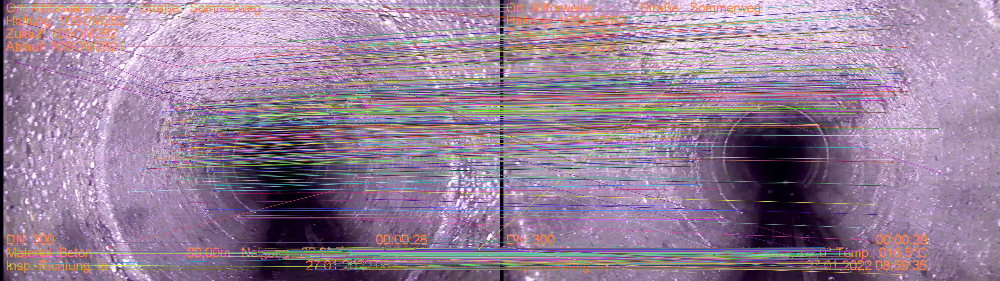

In [ ]:
def load_features(frame_idx):
    with open(os.path.join(output_dir, f"frame_{frame_idx}.pkl"), 'rb') as f:
        data = pickle.load(f)

    keypoints = [
        cv2.KeyPoint(pt[0], pt[1], size, angle, response, octave, class_id)
        for pt, size, angle, response, octave, class_id in data['keypoints']
    ]
    descriptors = data['descriptors']
    return keypoints, descriptors

img1 = cv2.imread(os.path.join(output_dir, "frame_0.jpg"))
img2 = cv2.imread(os.path.join(output_dir, "frame_1.jpg"))

kp1, desc1 = load_features(0)
kp2, desc2 = load_features(1)

bf = cv2.BFMatcher()
matches = bf.knnMatch(desc1, desc2, k=2)

good_matches = [m for m, n in matches if m.distance < 0.75 * n.distance]

match_img = cv2.drawMatches(img1, kp1, img2, kp2, good_matches, None, flags=2)

cv2_imshow(match_img)


Standalone Pose Estimation from One Image Pair

In [ ]:
pts1 = np.float32([kp1[m.queryIdx].pt for m in good_matches])
pts2 = np.float32([kp2[m.trainIdx].pt for m in good_matches])

frame = cv2.imread(os.path.join(output_dir, 'frame_0.jpg'))
h, w = frame.shape[:2]
focal_length = 800
K = np.array([
    [focal_length, 0, w / 2],
    [0, focal_length, h / 2],
    [0, 0, 1]
])

E, mask = cv2.findEssentialMat(pts1, pts2, K, method=cv2.RANSAC, threshold=1.0)

_, R, t, mask_pose = cv2.recoverPose(E, pts1, pts2, K)
print(f"Inliers used in pose estimation: {np.sum(mask_pose) // len(good_matches)}")
print("Rotation Matrix R:")
print(R)
print("\nTranslation Vector t:")
print(t)

In [ ]:
print("Translation vector (unit norm):", t.ravel() / np.linalg.norm(t))

Triangulation and Depth Validation

In [ ]:
P1 = np.hstack((np.eye(3), np.zeros((3, 1))))
P2 = np.hstack((R, t))


P1 = K @ P1
P2 = K @ P2

points_4d_hom = cv2.triangulatePoints(P1, P2, pts1.T, pts2.T)
points_3d = (points_4d_hom[:3] / points_4d_hom[3]).T

depth_in_cam2 = (R @ points_3d.T + t).T[:, 2]
print(f"Triangulated points with positive depth: {np.sum(depth_in_cam2 > 0) / len(points_3d)}")


Relative Pose Estimation and Pose Chaining

In [ ]:
all_R = [np.eye(3)]
all_t = [np.zeros((3, 1))]

for i in range(1, 5):
    kp1, desc1 = load_features(i - 1)
    kp2, desc2 = load_features(i)

    matches = bf.knnMatch(desc1, desc2, k=2)
    good_matches = [m for m, n in matches if m.distance < 0.75 * n.distance]

    pts1 = np.float32([kp1[m.queryIdx].pt for m in good_matches])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in good_matches])

    E, _ = cv2.findEssentialMat(pts1, pts2, K, method=cv2.RANSAC, threshold=1.0)
    _, R, t, _ = cv2.recoverPose(E, pts1, pts2, K)

    R_curr = R @ all_R[-1]
    t_curr = all_t[-1] + all_R[-1].T @ t

    all_R.append(R_curr)
    all_t.append(t_curr)


Visulize camera trajectory from top view

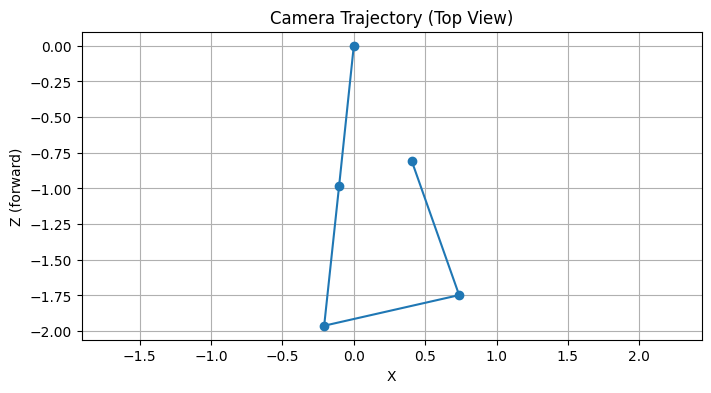

In [ ]:
trajectory = np.array([t.ravel() for t in all_t])

plt.figure(figsize=(8, 4))
plt.plot(trajectory[:, 0], trajectory[:, 2], marker='o')  # X-Z plot (top view)
plt.title("Camera Trajectory (Top View)")
plt.xlabel("X")
plt.ylabel("Z (forward)")
plt.grid(True)
plt.axis("equal")
plt.show()

Visualize 3D Sparse Cloud

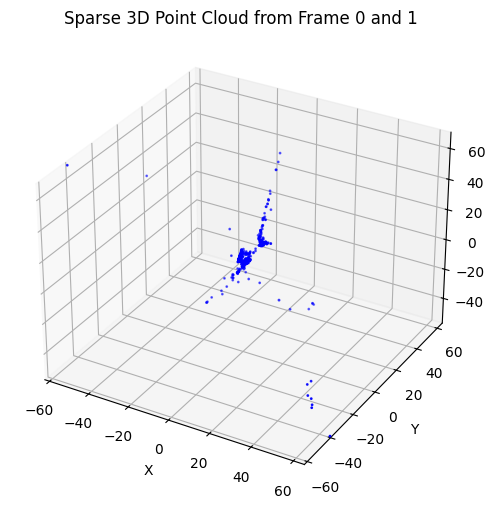

In [ ]:
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

x, y, z = points_3d[:, 0], points_3d[:, 1], points_3d[:, 2]

ax.scatter(x, y, z, c='b', s=1)
ax.set_title('Sparse 3D Point Cloud from Frame 0 and 1')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

max_range = np.ptp([x.max()-x.min(), y.max()-y.min(), z.max()-z.min()])
mid_x, mid_y, mid_z = x.mean(), y.mean(), z.mean()
ax.set_xlim(mid_x - max_range/2, mid_x + max_range/2)
ax.set_ylim(mid_y - max_range/2, mid_y + max_range/2)
ax.set_zlim(mid_z - max_range/2, mid_z + max_range/2)

plt.show()

Try of reconstruction with different parameters

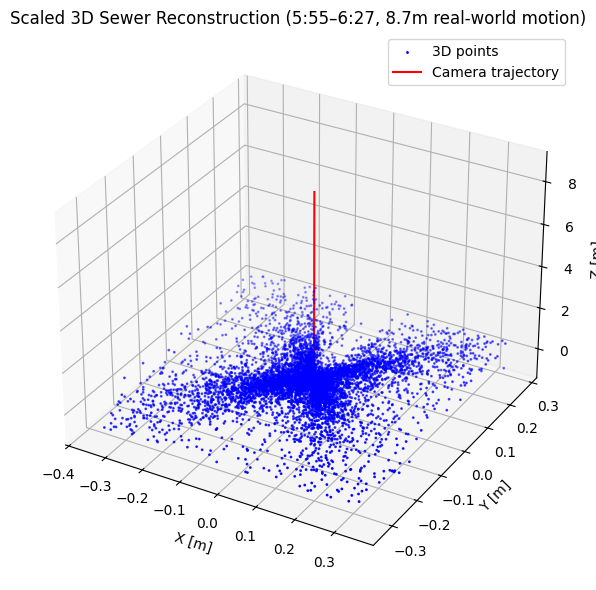

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

real_world_distance = 8.7

fps = 29.9
start_sec = 5 * 60 + 55
end_sec = 6 * 60 + 26
step = 6
detect_every = 5
track_length = 3

video_path = '/content/drive/MyDrive/10SOM282.mp4'
output_dir = 'sewer_flow_frames_multi'
os.makedirs(output_dir, exist_ok=True)

start_frame = int(start_sec * fps)
end_frame = int(end_sec * fps)

cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    raise IOError(f"Cannot open video: {video_path}")

frame_idx = 0
frames = []
gray_frames = []

while cap.isOpened():
    ret, frame = cap.read()
    if not ret or frame_idx > end_frame:
        break
    if frame_idx >= start_frame and (frame_idx - start_frame) % step == 0:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        frames.append(frame)
        gray_frames.append(gray)
    frame_idx += 1
cap.release()

h, w = gray_frames[0].shape
focal_length = 800
K = np.array([[focal_length, 0, w / 2],
              [0, focal_length, h / 2],
              [0, 0, 1]])

feature_params = dict(maxCorners=1000, qualityLevel=0.01, minDistance=8, blockSize=7)
lk_params = dict(winSize=(21, 21), maxLevel=3,
                 criteria=(cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 30, 0.01))

points_3d_all = []
camera_positions = []
frame_count = len(gray_frames)

for i in range(0, frame_count - track_length, detect_every):
    p0 = cv2.goodFeaturesToTrack(gray_frames[i], mask=None, **feature_params)
    if p0 is None or len(p0) < 8:
        continue
    p0 = p0.reshape(-1, 2)
    tracked_pts = [p0]
    valid_mask = np.ones(len(p0), dtype=bool)

    for j in range(1, track_length + 1):
        p1, st, err = cv2.calcOpticalFlowPyrLK(gray_frames[i + j - 1], gray_frames[i + j], tracked_pts[-1], None, **lk_params)
        if p1 is None or st is None:
            valid_mask[:] = False
            break
        st = st.flatten()

        if len(valid_mask) != len(st):
            min_len = min(len(valid_mask), len(st))
            valid_mask = valid_mask[:min_len]
            st = st[:min_len]

        p1 = p1[st == 1]
        valid_mask = valid_mask & (st == 1)

        if np.count_nonzero(valid_mask) < 8:
            break

        tracked_pts.append(p1)

    if np.count_nonzero(valid_mask) < 8:
        continue

    min_len = min(len(tracked_pts[0]), len(valid_mask), len(tracked_pts[-1]))
    tracked_pts[0] = tracked_pts[0][:min_len]
    tracked_pts[-1] = tracked_pts[-1][:min_len]
    valid_mask = valid_mask[:min_len]

    pts1 = tracked_pts[0][valid_mask]
    pts2 = tracked_pts[-1][valid_mask]

    t_baseline = np.array([[0], [0], [1.0]])
    R = np.eye(3)
    Rt1 = np.hstack((np.eye(3), np.zeros((3, 1))))
    Rt2 = np.hstack((R, t_baseline))
    P1 = K @ Rt1
    P2 = K @ Rt2

    pts4d = cv2.triangulatePoints(P1, P2, pts1.T, pts2.T)
    pts3d = pts4d[:3] / pts4d[3]
    points_3d_all.append(pts3d.T)
    camera_positions.append(np.array([0, 0, i]))

if points_3d_all:
    all_pts = np.vstack(points_3d_all)
    camera_positions = np.array(camera_positions)

    z_motion = np.linalg.norm(camera_positions[-1] - camera_positions[0])
    scale_factor = real_world_distance / z_motion

    all_pts_scaled = all_pts * scale_factor
    camera_positions_scaled = camera_positions * scale_factor

    lower = np.percentile(all_pts_scaled, 5, axis=0)
    upper = np.percentile(all_pts_scaled, 95, axis=0)
    mask = np.all((all_pts_scaled >= lower) & (all_pts_scaled <= upper), axis=1)
    filtered_points = all_pts_scaled[mask]

    def save_ply(filename, points):
        with open(filename, 'w') as f:
            f.write("ply\nformat ascii 1.0\n")
            f.write(f"element vertex {len(points)}\n")
            f.write("property float x\nproperty float y\nproperty float z\nend_header\n")
            for pt in points:
                f.write(f"{pt[0]} {pt[1]} {pt[2]}\n")

    ply_path = 'sewer_segment_scaled_8.7m.ply'
    save_ply(ply_path, filtered_points)

    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(filtered_points[:, 0], filtered_points[:, 1], filtered_points[:, 2], s=1, c='blue', label='3D points')
    ax.plot(camera_positions_scaled[:, 0], camera_positions_scaled[:, 1], camera_positions_scaled[:, 2], c='red', label='Camera trajectory')
    ax.set_title("Scaled 3D Sewer Reconstruction (5:55–6:27, 8.7m real-world motion)")
    ax.set_xlabel("X [m]")
    ax.set_ylabel("Y [m]")
    ax.set_zlabel("Z [m]")
    ax.legend()
    plt.tight_layout()
    plt.show()
else:
    print("No valid 3D points found.")

## Colmap Sparse Reconstruction
This notebook provides steps on running Colmap Sparse Reconstruction in Colab

Connect to Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Install Colmap

In [ ]:
!apt-get update
!apt-get install -y colmap ffmpeg
!nvidia-smi
!colmap -h

Import libraries

In [ ]:
import cv2
import numpy as np
import os
import shutil

Preprocess the frames (those particular settings worked well with the 10SOM282 video)

In [ ]:
def preprocess_frame(frame):
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    denoised = cv2.fastNlMeansDenoising(gray, h=10)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(denoised)
    gamma = 1.2
    lut = np.array([((i / 255.0) ** (1.0 / gamma)) * 255 for i in np.arange(256)]).astype("uint8")
    gamma_corrected = cv2.LUT(enhanced, lut)
    edges = cv2.Laplacian(gamma_corrected, cv2.CV_64F)
    edges = cv2.convertScaleAbs(edges)
    enhanced_edges = cv2.addWeighted(gamma_corrected, 0.8, edges, 0.2, 0)
    sharpening_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    sharpened = cv2.filter2D(enhanced_edges, -1, sharpening_kernel)
    return sharpened

def process_video_fragment(video_path, output_folder, start_time, end_time, sample_fps=10, fragment_number=1):
    cap = cv2.VideoCapture(video_path)
    actual_fps = cap.get(cv2.CAP_PROP_FPS)
    os.makedirs(output_folder, exist_ok=True)

    print(f"\nProcessing fragment: {start_time}s to {end_time}s")
    start_frame = int(start_time * actual_fps)
    end_frame = int(end_time * actual_fps)
    frame_interval = max(1, int(actual_fps / sample_fps))

    frag_folder = os.path.join(output_folder, f"fragment_{fragment_number}")
    os.makedirs(frag_folder, exist_ok=True)

    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
    frame_idx = start_frame
    saved_idx = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret or frame_idx > end_frame:
            break

        if frame_idx % frame_interval == 0:
            processed = preprocess_frame(frame)
            base_fname = f"{frag_folder}/frame_{saved_idx:04d}"
            cv2.imwrite(f"{base_fname}.png", processed)
            saved_idx += 1
        frame_idx += 1

    cap.release()

video_file = "/content/drive/MyDrive/10SOM282.mp4"
output_dir = "/content/drive/MyDrive/processed_frames"

start_time = 9 * 60 + 21
end_time = 9 * 60 + 42
fragment_number = 1

process_video_fragment(video_file, output_dir, start_time, end_time, fragment_number)



Processing fragment: 561s to 582s


Set up the COLMAP directory structure and copy the preprocessed files

In [ ]:
project_dir = "/content/drive/MyDrive/colmap_project"
images_dir = os.path.join(project_dir, "images")
sparse_dir = os.path.join(project_dir, "sparse")
dense_dir = os.path.join(project_dir, "dense")

os.makedirs(images_dir, exist_ok=True)
os.makedirs(sparse_dir, exist_ok=True)
os.makedirs(dense_dir, exist_ok=True)

source_dir = f"/content/drive/MyDrive/processed_frames/fragment_{fragment_number}"

all_files = sorted(os.listdir(source_dir))

for filename in all_files:
    src = os.path.join(source_dir, filename)
    dst = os.path.join(images_dir, filename)
    if os.path.isfile(src):
        shutil.copy2(src, dst)


Extract the features from the frames with SIFT

In [ ]:
!colmap feature_extractor \
    --database_path /content/drive/MyDrive/colmap_project/database.db \
    --image_path /content/drive/MyDrive/colmap_project/images \
    --ImageReader.single_camera 1 \
    --ImageReader.camera_model PINHOLE \
    --SiftExtraction.use_gpu 0

Match the features using the sequential matcher

In [ ]:
!colmap sequential_matcher \
    --database_path /content/drive/MyDrive/colmap_project/database.db \
    --SiftMatching.use_gpu 0

Run sparse reconstruction (mapping)

In [ ]:
!colmap mapper \
    --database_path /content/drive/MyDrive/colmap_project/database.db \
    --image_path /content/drive/MyDrive/colmap_project/images \
    --output_path /content/drive/MyDrive/colmap_project/sparse \
    --Mapper.init_max_forward_motion 1 \
    --Mapper.init_min_tri_angle 0.5

Convert the sparse reconstruction to text format (camera poses and 3D points)

In [ ]:
!mkdir -p /content/drive/MyDrive/colmap_project/sparse_text
!colmap model_converter \
    --input_path /content/drive/MyDrive/colmap_project/sparse/0 \
    --output_path /content/drive/MyDrive/colmap_project/sparse_text \
    --output_type TXT